# Style Transfer

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import datasets, transforms
from torch.autograd import Variable
from skimage import io
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import torchvision
import time

import torchvision.models as models

In [2]:
torch.cuda.empty_cache()

In [3]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

In [4]:
print(device)

cuda:1


## Load the dataset

We have our data in an images/paintings/valid directory

In [5]:
import os

transform = transforms.Compose([
        transforms.Resize(300),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalize for VGG
    ])

data_dir = 'photos'
data = { x : datasets.ImageFolder(os.path.join(data_dir, x), transform) for x in ['content', 'style']}
dataloaders = {x : torch.utils.data.DataLoader(data[x], batch_size=1, shuffle=True, num_workers=1) for x in ['content', 'style'] } # feed one content image

### What is actually in the dataset:

In [6]:
data

{'content': Dataset ImageFolder
     Number of datapoints: 2
     Root Location: photos/content
     Transforms (if any): Compose(
                              Resize(size=300, interpolation=PIL.Image.BILINEAR)
                              ToTensor()
                              Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                          )
     Target Transforms (if any): None, 'style': Dataset ImageFolder
     Number of datapoints: 14
     Root Location: photos/style
     Transforms (if any): Compose(
                              Resize(size=300, interpolation=PIL.Image.BILINEAR)
                              ToTensor()
                              Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                          )
     Target Transforms (if any): None}

## Load the Pretrained VGG Model

In [7]:
vgg19 = models.vgg19(pretrained=True).features
vgg19 = vgg19.to(device).eval()

The following is taken from a style transfer example:

In [8]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

In [9]:
def gram_matrix(input):
    a, b, c, d = input.size()  
    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t()) 

    return G.div(a * b * c * d)

In [10]:
import functools

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

In [11]:
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model_and_losses(cnn, content_img, style_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    
    content_losses = []
    style_losses = []
    model = nn.Sequential()

    i = 0  
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d): # maybe do average pooling instead
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)
        
        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)
            
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, content_losses, style_losses

## Get Our images:

Rerun this section to generate a new content and style image.

In [12]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().squeeze().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

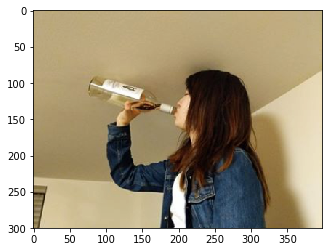

In [17]:
content = next(iter(dataloaders['content']))[0].to(device)
imshow(content.cpu())

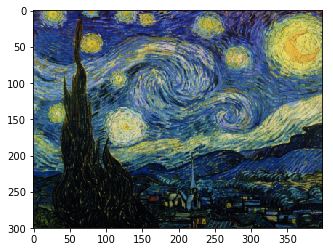

In [20]:
transform = transforms.Compose([
        transforms.Resize(tuple(content.shape[2:])),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalize for VGG
    ])

data_dir = 'photos/style'
style_data = datasets.ImageFolder(data_dir, transform)
style_dataloader = torch.utils.data.DataLoader(style_data, batch_size=1, shuffle=True, num_workers=1)

style = next(iter(style_dataloader))[0].to(device)
imshow(style.cpu())

In [21]:
def get_input_optimizer(input_img):
#     optimizer = optim.LBFGS([input_img.requires_grad_()])
    optimizer = optim.Adam([input_img.requires_grad_()], lr=0.01) # the paper uses L-BFGS, a pseudo-Hessian method
    return optimizer

## Generate our seed image

For our seed, we can either choose to generate a random seed, or we can use the content image itself. I've found that using the content image works better, but either works fine.

In [22]:
seed = content

In [23]:
# seed = torch.randn_like(content).to(device)

To use a random image, use ```seed = torch.randn_like(content).to(device) # random seed```

In [24]:
optimizer = get_input_optimizer(seed)

In [25]:
seed.shape, content.shape, style.shape

(torch.Size([1, 3, 300, 399]),
 torch.Size([1, 3, 300, 399]),
 torch.Size([1, 3, 300, 399]))

## Build our network

In [26]:
print(seed.shape)

model, content_losses, style_losses = get_style_model_and_losses(vgg19, content, style)
# del vgg19 # free cuda memory

torch.Size([1, 3, 300, 399])


## Define Style Transfer Train Function

In [27]:
def train(style_ratio = 1000000, num_epochs = 1000):
    correct = 0

    since = time.time()

    for epoch in range(num_epochs):

        if epoch % 100 == 0:
            print('Epoch {}/{}'.format(epoch, num_epochs - 1))
            print('-' * 10)
            imshow(seed.detach().cpu())
            model.eval()
            model(seed)

            content_loss = 0
            style_loss = 0

            for cl in content_losses:
                content_loss += cl.loss
            for sl in style_losses:
                style_loss += sl.loss

            style_loss = style_ratio * style_loss
            content_loss = content_loss

            loss = style_loss + content_loss

            print('loss:', float(loss), 'style_loss:', float(style_loss), 'content_loss:', float(content_loss))

        model.train()

        # forward
        with torch.set_grad_enabled(True):
            def closure():
                optimizer.zero_grad()
                model(seed)

                content_loss = 0
                style_loss = 0

                for cl in content_losses:
                    content_loss += cl.loss
                for sl in style_losses:
                    style_loss += sl.loss

                style_loss = style_ratio * style_loss
                content_loss = content_loss

                loss = content_loss + style_loss

                loss.backward()

                return loss

            optimizer.step(closure)

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))

## Training

If you are using a random seed, it may be helpful to train for 1000 iterations with a low style weight, say 1000 before proceeding with a higher style ratio.

Epoch 0/4999
----------


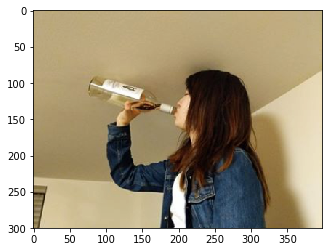

loss: 23649920.0 style_loss: 23649920.0 content_loss: 0.0
Epoch 100/4999
----------


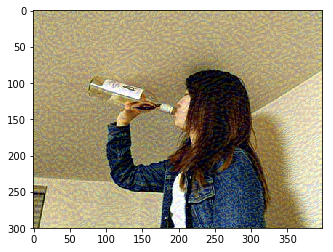

loss: 938931.125 style_loss: 938913.0625 content_loss: 18.06897735595703
Epoch 200/4999
----------


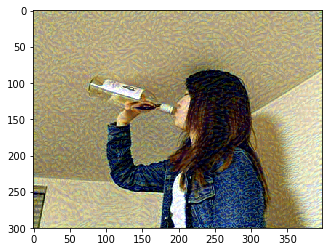

loss: 531162.375 style_loss: 531143.625 content_loss: 18.723529815673828
Epoch 300/4999
----------


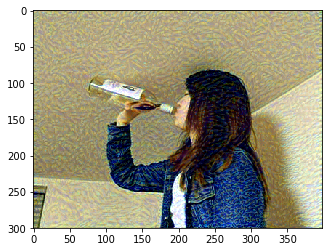

loss: 344950.65625 style_loss: 344931.5625 content_loss: 19.091115951538086
Epoch 400/4999
----------


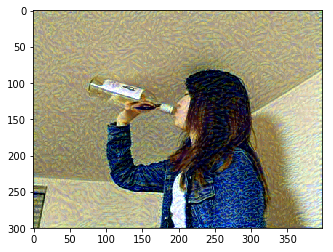

loss: 232954.03125 style_loss: 232934.65625 content_loss: 19.379180908203125
Epoch 500/4999
----------


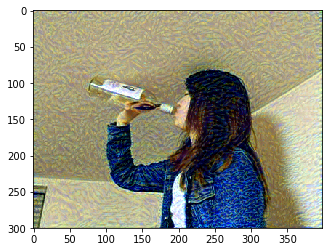

loss: 169670.71875 style_loss: 169651.109375 content_loss: 19.611597061157227
Epoch 600/4999
----------


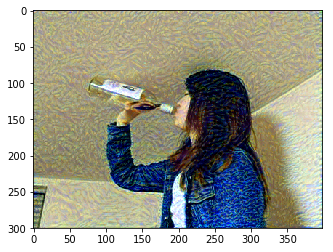

loss: 135543.578125 style_loss: 135523.765625 content_loss: 19.808210372924805
Epoch 700/4999
----------


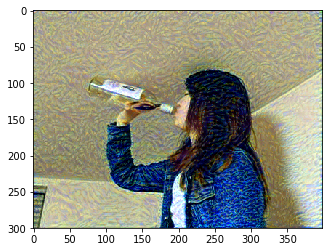

loss: 115310.8984375 style_loss: 115290.9140625 content_loss: 19.981342315673828
Epoch 800/4999
----------


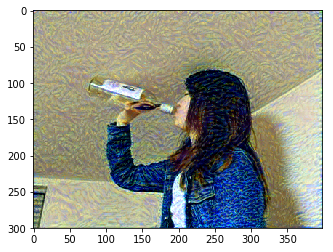

loss: 101223.5625 style_loss: 101203.421875 content_loss: 20.139284133911133
Epoch 900/4999
----------


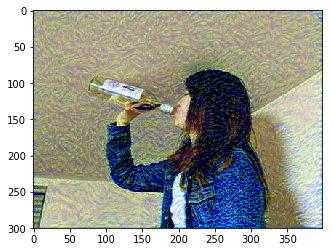

loss: 90244.2890625 style_loss: 90224.0 content_loss: 20.287832260131836
Epoch 1000/4999
----------


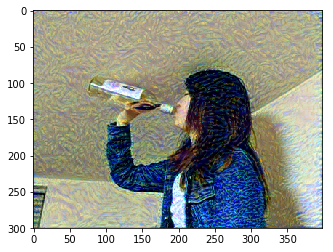

loss: 81187.09375 style_loss: 81166.6640625 content_loss: 20.428295135498047
Epoch 1100/4999
----------


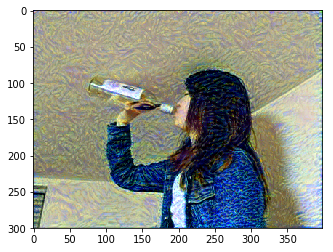

loss: 73508.78125 style_loss: 73488.21875 content_loss: 20.562667846679688
Epoch 1200/4999
----------


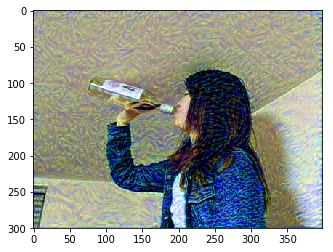

loss: 66944.484375 style_loss: 66923.796875 content_loss: 20.689861297607422
Epoch 1300/4999
----------


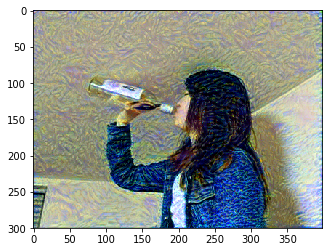

loss: 61281.69921875 style_loss: 61260.88671875 content_loss: 20.81117057800293
Epoch 1400/4999
----------


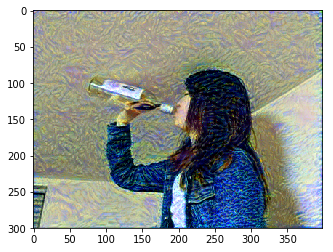

loss: 56406.1328125 style_loss: 56385.20703125 content_loss: 20.925233840942383
Epoch 1500/4999
----------


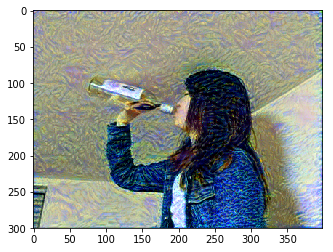

loss: 52227.35546875 style_loss: 52206.32421875 content_loss: 21.03266143798828
Epoch 1600/4999
----------


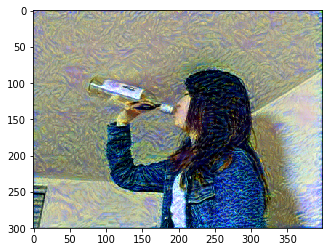

loss: 48631.76953125 style_loss: 48610.63671875 content_loss: 21.133569717407227
Epoch 1700/4999
----------


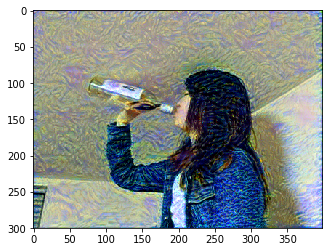

loss: 45529.890625 style_loss: 45508.6640625 content_loss: 21.22815704345703
Epoch 1800/4999
----------


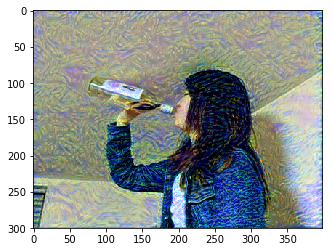

loss: 42842.0 style_loss: 42820.68359375 content_loss: 21.317697525024414
Epoch 1900/4999
----------


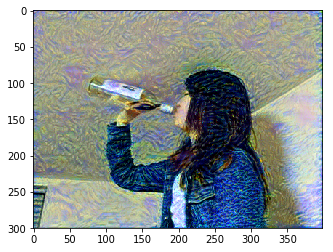

loss: 40487.3359375 style_loss: 40465.93359375 content_loss: 21.40369987487793
Epoch 2000/4999
----------


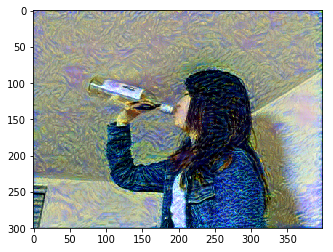

loss: 38407.30859375 style_loss: 38385.82421875 content_loss: 21.48592758178711
Epoch 2100/4999
----------


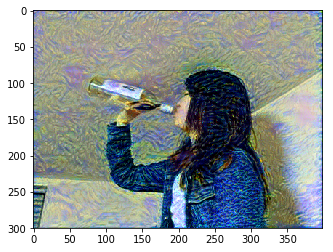

loss: 36548.546875 style_loss: 36526.98046875 content_loss: 21.56496238708496
Epoch 2200/4999
----------


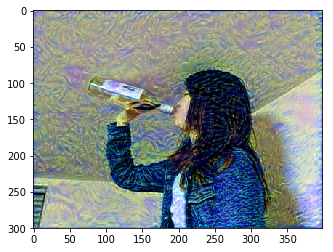

loss: 34866.47265625 style_loss: 34844.83203125 content_loss: 21.64078712463379
Epoch 2300/4999
----------


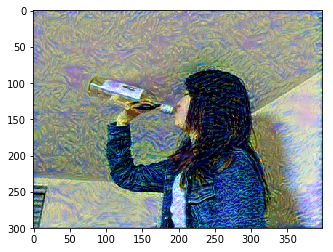

loss: 33325.59765625 style_loss: 33303.8828125 content_loss: 21.713716506958008
Epoch 2400/4999
----------


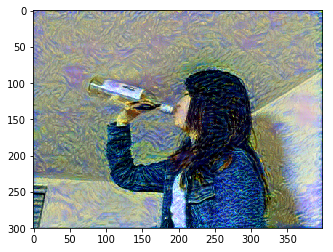

loss: 31899.080078125 style_loss: 31877.294921875 content_loss: 21.785022735595703
Epoch 2500/4999
----------


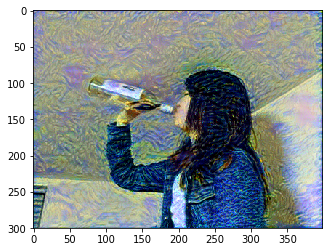

loss: 30566.826171875 style_loss: 30544.97265625 content_loss: 21.853567123413086
Epoch 2600/4999
----------


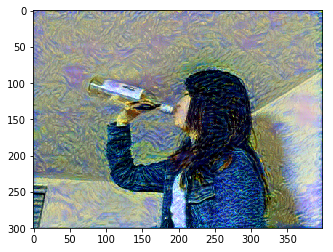

loss: 29310.7421875 style_loss: 29288.822265625 content_loss: 21.920795440673828
Epoch 2700/4999
----------


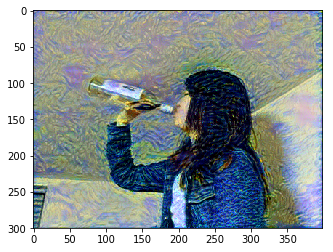

loss: 28119.87109375 style_loss: 28097.884765625 content_loss: 21.986330032348633
Epoch 2800/4999
----------


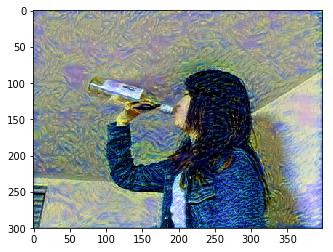

loss: 26984.38671875 style_loss: 26962.3359375 content_loss: 22.05113410949707
Epoch 2900/4999
----------


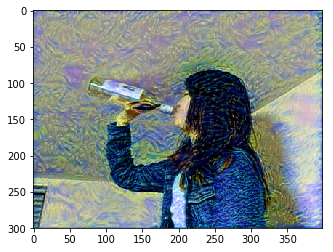

loss: 25896.091796875 style_loss: 25873.9765625 content_loss: 22.11578369140625
Epoch 3000/4999
----------


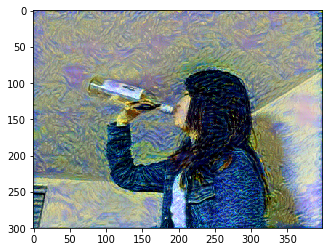

loss: 24851.19140625 style_loss: 24829.01171875 content_loss: 22.180269241333008
Epoch 3100/4999
----------


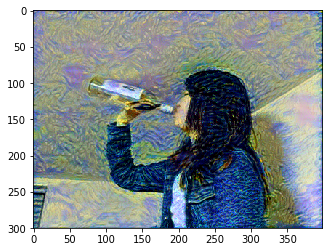

loss: 23846.169921875 style_loss: 23823.92578125 content_loss: 22.24404525756836
Epoch 3200/4999
----------


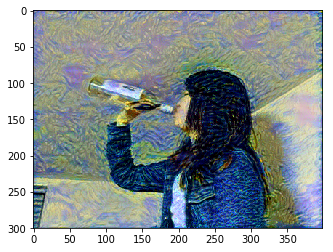

loss: 22875.134765625 style_loss: 22852.826171875 content_loss: 22.307621002197266
Epoch 3300/4999
----------


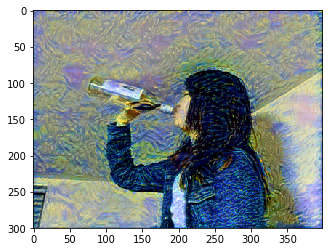

loss: 21934.037109375 style_loss: 21911.666015625 content_loss: 22.37119483947754
Epoch 3400/4999
----------


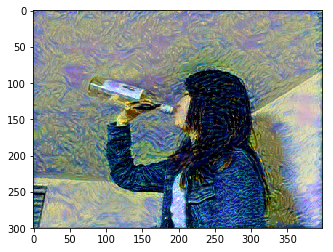

loss: 21019.642578125 style_loss: 20997.208984375 content_loss: 22.43429946899414
Epoch 3500/4999
----------


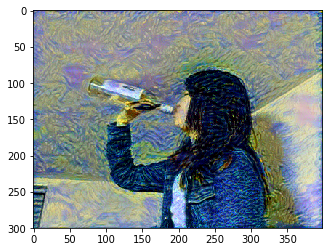

loss: 20130.31640625 style_loss: 20107.818359375 content_loss: 22.49711799621582
Epoch 3600/4999
----------


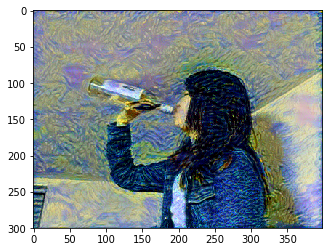

loss: 19266.810546875 style_loss: 19244.25 content_loss: 22.55965805053711
Epoch 3700/4999
----------


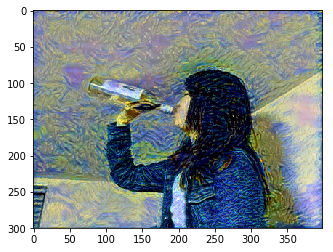

loss: 18426.94140625 style_loss: 18404.318359375 content_loss: 22.62322425842285
Epoch 3800/4999
----------


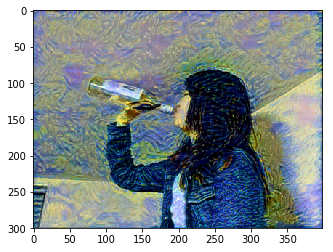

loss: 17607.650390625 style_loss: 17584.962890625 content_loss: 22.687217712402344
Epoch 3900/4999
----------


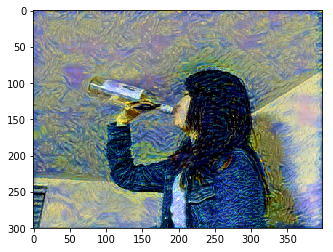

loss: 16807.833984375 style_loss: 16785.08203125 content_loss: 22.751890182495117
Epoch 4000/4999
----------


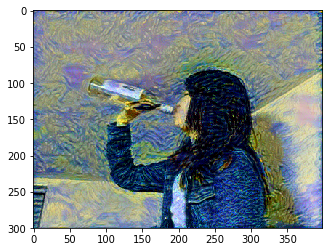

loss: 16026.787109375 style_loss: 16003.970703125 content_loss: 22.81688117980957
Epoch 4100/4999
----------


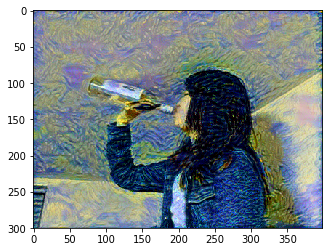

loss: 15263.7236328125 style_loss: 15240.8408203125 content_loss: 22.88241195678711
Epoch 4200/4999
----------


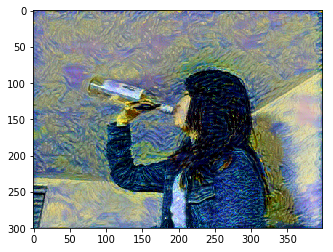

loss: 14523.966796875 style_loss: 14501.015625 content_loss: 22.950746536254883
Epoch 4300/4999
----------


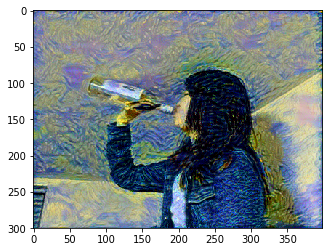

loss: 13797.7314453125 style_loss: 13774.7158203125 content_loss: 23.01587677001953


KeyboardInterrupt: 

In [28]:
train(style_ratio = 1000000000, num_epochs=5000)

## Visualize:

Now we can visualize our image. If it doesn't look good, try rerunning the previous step, or changing the style weight value.

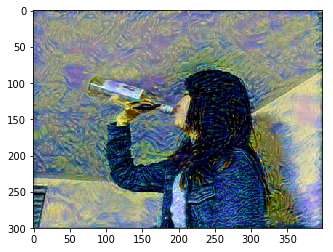

In [29]:
imshow(seed.detach().cpu())

In [32]:
def imsave(inp, path="image.png"):
    """Imshow for Tensor."""
    inp = inp.numpy().squeeze().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imsave(path, inp)
    plt.pause(0.001)  # pause a bit so that plots are updated

In [33]:
imsave(seed.detach().cpu())